In [175]:
import os
import pandas as pd # for data manipulation operations
import numpy as np # for linear algebra
from scipy import stats
#Libraries for visualization
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import seaborn as sns
#Preprocessing features
import sklearn
from sklearn.preprocessing import LabelEncoder # for making dummy variables
from sklearn.preprocessing import MinMaxScaler,StandardScaler # for standardization


In [48]:
wineq_gen=pd.read_csv('/Users/mac/Desktop/DATA/portfolio/2.Wine_Features/winequality_red.csv')
print('Overview of the dataset')
print('There are {} rows and {} columns'.format(wineq_gen.shape[0],wineq_gen.shape[1]))
quality_corr=wineq_gen.corr()
quality_corr.quality.abs().sort_values(ascending=0)

#drop nan values & zero value in column quality, no nan/null value nor zero values in column quality
wineq_gen.quality.isna().values.sum().count
wineq_gen.loc[(wineq_gen.quality[0:,]==0)]
wineq_gen.quality.isnull().sum().count() #filter out the data that has no quality score.

Overview of the dataset
There are 1599 rows and 12 columns


quality                 1.000000
alcohol                 0.476166
volatile acidity        0.390558
sulphates               0.251397
citric acid             0.226373
total sulfur dioxide    0.185100
density                 0.174919
chlorides               0.128907
fixed acidity           0.124052
pH                      0.057731
free sulfur dioxide     0.050656
residual sugar          0.013732
Name: quality, dtype: float64

In [51]:
def remove_space(chars,space): # Reform column names,remove empty space 
    new_col=[]
    for char in chars:
        char=char.replace(space,'_')

        new_col.append(char)
    return new_col

new_column=remove_space(wineq_gen.columns,' ')

In [52]:
wineq_gen.columns=new_column

In [58]:
wineq_gen.quality.describe()
wineq_gen.loc[(wineq_gen.total_sulfur_dioxide>150)].quality.mean()# Wines that have higher than normal amount of total sulfur tend to have a mediocre quality score.

5.666666666666667

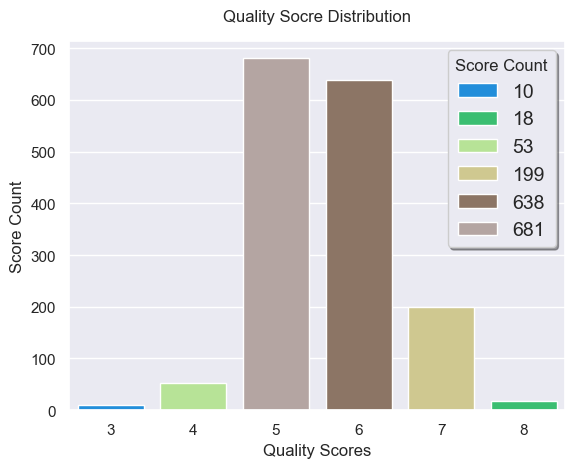

In [475]:
bar_palette=sns.color_palette('terrain',6)
ax1=sns.barplot(x=wineq_gen.quality.value_counts().index,y=wineq_gen.quality.value_counts(),hue=wineq_gen.quality.value_counts(),dodge=False,palette=bar_palette)
ax1.set(xlabel='Quality Scores',ylabel='Score Count')
ax1.set_title('Quality Socre Distribution', y=1.03)
sns.move_legend(ax1,loc='upper right',)
plt.legend(title='Score Count',shadow=1,fontsize=14)
plt.savefig('/Users/mac/Desktop/score_bar.jpg',dpi=300)
# Since score 5 & 6 account for majority of the socres, I will convert column 'quality' to binary column 'qualitybi' later in the preprocessing process and utlized Logistic Regression.

In [329]:
quality_re=wineq_gen1.copy()
quality_new=pd.DataFrame(np.where(quality_re.quality>=6,1,0)) # Sperating Wines above score 6 to category 1 and below score 6 to cateogory 0
quality_re=pd.concat([quality_re, quality_new], axis=1)
quality_re.rename(columns={ quality_re.columns[-1]: "qualitybi" })
quality_re=wineq_gen1


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,quality_new,quality_new
0,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.510,0.82,11.9,6.5,1,1
1,10.4,0.880,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5,1,1
2,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5,1,1
3,11.2,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5,1,1
4,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.510,0.82,11.9,6.5,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.080,2.00,0.0900,32.0,44.0,0.994900,3.450,0.58,10.5,5.0,0,0
1595,5.9,0.550,0.100,2.20,0.0620,39.0,51.0,0.995120,3.520,0.76,11.2,6.0,1,1
1596,6.3,0.510,0.130,2.30,0.0760,29.0,40.0,0.995740,3.420,0.75,11.0,6.0,1,1
1597,5.9,0.645,0.120,2.00,0.0750,32.0,44.0,0.995470,3.570,0.71,10.2,5.0,0,0


<AxesSubplot: xlabel='volatile_acidity', ylabel='quality'>

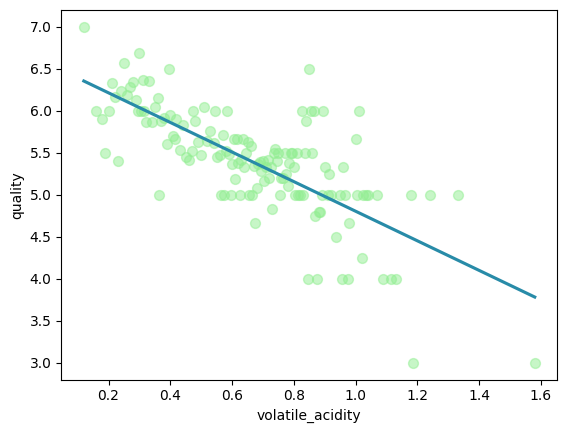

In [153]:
sns.regplot(x='volatile_acidity',y='quality',data=wineq_gen,ci=None,color='#288BA8',x_jitter=0.1,x_estimator=np.mean,scatter_kws={'alpha':0.5,'color':'lightgreen'})
# Volatile Acid is usually consider as a faulty deature in wine, the negative correlation validates the credibility of the dataset.

In [281]:
wineq_gen1=wineq_gen._get_numeric_data()  # Reudce outlier by the IQR method, converting the data that is outside of the upper bound and lower bound to bound limit value.
q1=wineq_gen.quantile(0.25)
q3=wineq_gen.quantile(0.75)
iqr=q3-q1
lower_bound=q1+iqr*1.5
upper_bound=q3+iqr*1.5
def mod_outlier(df):
    for col in wineq_gen1.columns:
        for i in range(0,len(wineq_gen1.columns)):
            if wineq_gen1[col][i]<=lower_bound[col]:
                wineq_gen1[col][i]=lower_bound[col]
            if wineq_gen1[col][i]>=upper_bound[col]:
                wineq_gen1[col][i]=upper_bound[col]
    return(wineq_gen1)



mod_outlier(wineq_gen1)





,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.510,0.82,11.9,6.5
1,10.4,0.880,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5
2,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5
3,11.2,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.495,0.82,11.9,6.5
4,10.4,0.765,0.595,2.95,0.1015,29.5,83.5,0.999035,3.510,0.82,11.9,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.080,2.00,0.0900,32.0,44.0,0.994900,3.450,0.58,10.5,5.0
1595,5.9,0.550,0.100,2.20,0.0620,39.0,51.0,0.995120,3.520,0.76,11.2,6.0
1596,6.3,0.510,0.130,2.30,0.0760,29.0,40.0,0.995740,3.420,0.75,11.0,6.0
1597,5.9,0.645,0.120,2.00,0.0750,32.0,44.0,0.995470,3.570,0.71,10.2,5.0


In [561]:
for col in wineq_gen1.columns[:-1]: # check current outlier distribution through boxplot
    fig=px.box(wineq_gen1,y=col)
    fig.update_layout(height=500,width=1000)
    #fig.show()#All the outliers have been optimized according to Inter-Quartile ranges instead of completely removing them.

In [388]:
def add_mean_line(data,var=None,**kws): #function to insert mean line in histogram to see skewness
    #If no variable provided skip adding mean line
    if not var: return
    #Calculate mean for each group
    m=np.mean(data[var])
    #Get current axis
    ax=plt.gca()
    #Add line at group mean
    ax.axvline(m,color='maroon',lw=3,ls='--')
    #annotate group mean
    x_pos=0.65
    #if m > certain number: x_pos=0.2
    ax.text(x_pos,0.7,'mean={:.1f}'.format(m),transform=ax.transAxes,color='maroon',fontweight='bold',fontsize=12)

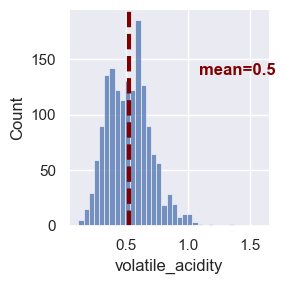

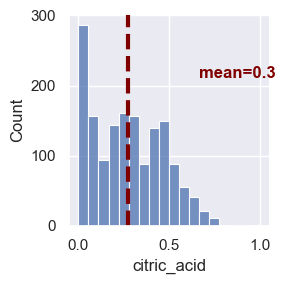

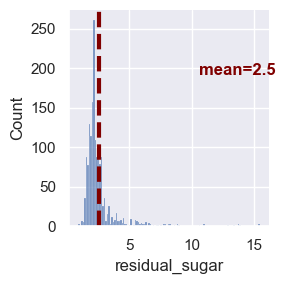

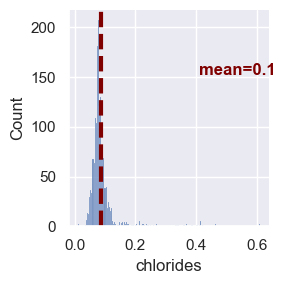

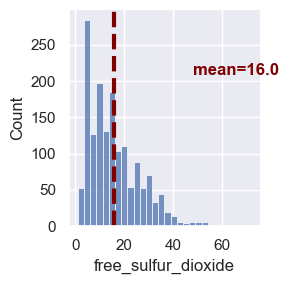

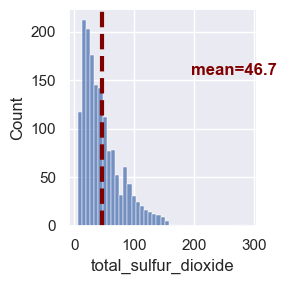

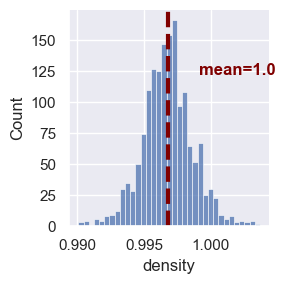

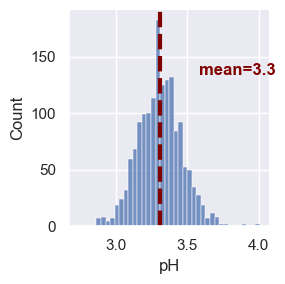

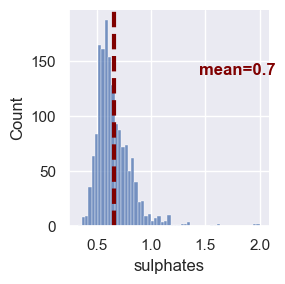

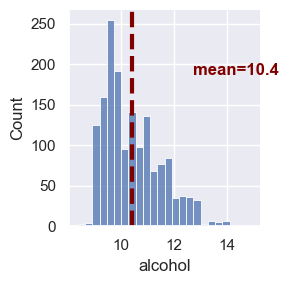

In [566]:
for i in wineq_gen1.columns[1:-2]: # This dataset is rather left skewed, indicating a need for eliminating outliers
    a=sns.FacetGrid(wineq_gen1)
    a.map_dataframe(sns.histplot,x=i)
    a.map_dataframe(add_mean_line,var=i)
    a.set_titles(col_template='{col_name} Wine')
#plt.savefig('/Users/mac/Desktop/feature_distribution.jpg',dpi=300)





In [556]:
type(wineq_gen1.columns[1:-2])

pandas.core.indexes.base.Index

In [535]:
from ipywidgets import interactive # A testout of ipywidget
def size_widget(height=2.5,aspect=1):
    sns.pairplot(wineq_gen1,hue='qualitybi',x_vars=['volatile_acidity', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density','sulphates', 'alcohol','residual_sugar'],y_vars=['fixed_acidity', 'citric_acid','pH'],aspect=aspect,palette='plasma')



In [536]:
interactive(size_widget,height=(1,3.5,0.5),aspect=(0.5,2,0.25))


interactive(children=(FloatSlider(value=2.5, description='height', max=3.5, min=1.0, step=0.5), FloatSlider(va…

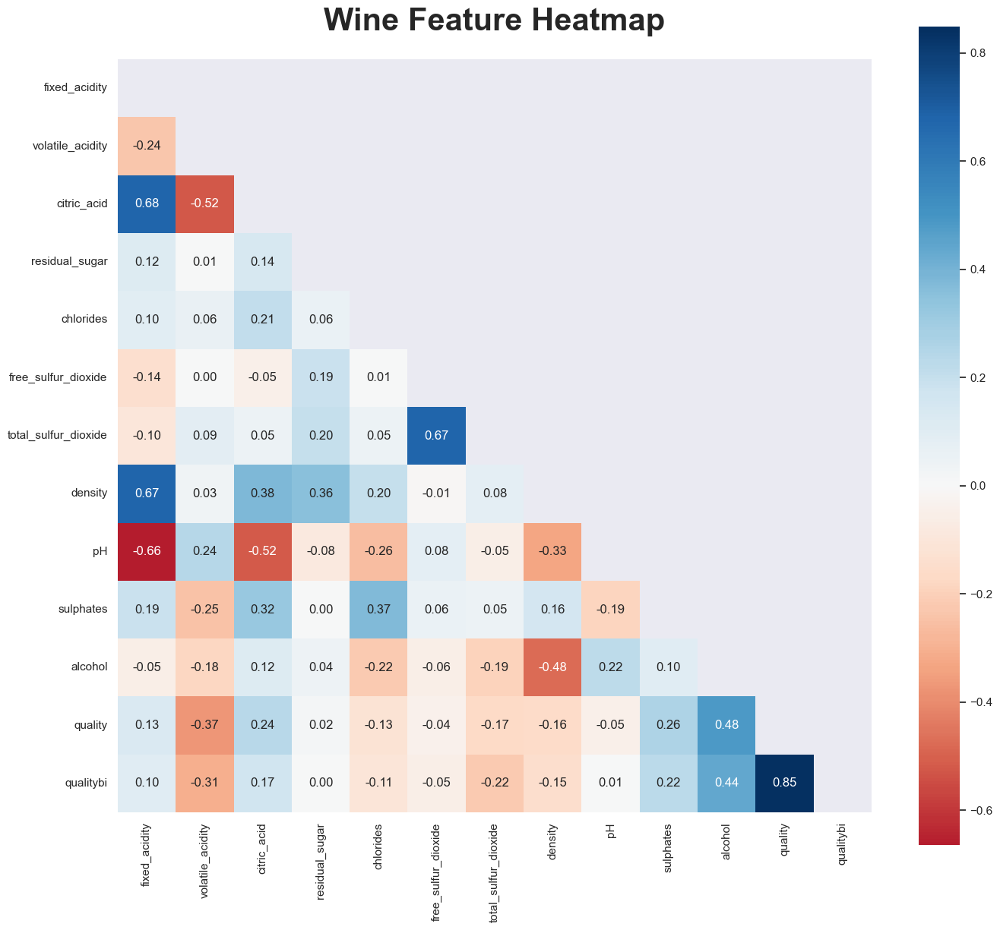

In [485]:
plt.figure(figsize=(16,14)) #Heatmap for feature correlation
wine_gen_matrix=wineq_gen1.corr()
mask=np.triu(np.ones_like(wine_gen_matrix,dtype=bool))
ax_feature_heatmap=sns.heatmap(wine_gen_matrix,center=0,annot=True,fmt='.2f',square=True,mask=mask,cmap='RdBu')
ax_feature_heatmap.set_title('Wine Feature Heatmap',size=30,y=1.03,fontweight ="bold")
plt.savefig('/Users/mac/Desktop/DATA/corr_wine.jpg',dpi=300)

In [715]:
variable=['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar','chlorides','free_sulfur_dioxide', 'total_sulfur_dioxide', 'density','pH', 'sulphates', 'alcohol']
dist_pairgrid=sns.PairGrid(wineq_gen1,diag_sharey=True,hue='qualitybi',vars=variable,height=8,aspect=1)
dist_pairgrid.map_offdiag(sns.scatterplot)
dist_pairgrid.map_diag(sns.boxplot)
dist_pairgrid.add_legend(title="Wine Quality")
dist_pairgrid.savefig('/Users/mac/Desktop/DATA/outlier.jpg',dpi=300)

In [599]:
X=wineq_gen1.drop(columns=['qualitybi','quality']) #Creat X variable
Y=wineq_gen1.qualitybi  #Creat Y variable
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.1,random_state=21) # Split dataset into train & test 

In [600]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train) #Regularize train & test yet not provididing mean & stdfor testing data
X_test_scaled=scaler.transform(X_test)

In [601]:
from sklearn.linear_model import LogisticRegression
log_reg=LogisticRegression(random_state=0,C=1,fit_intercept=True).fit(X_train_scaled,y_train)

In [603]:
#log_reg.predict(X_test_scaled)
#log_reg.score(X_train_scaled,y_train)
log_reg.score(X_test,y_test) # Equivalent to np.sum((log_reg.predict(X_test))==y_test)/len(y_test)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:402: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



0.58125

In [593]:
log_reg.intercept_
log_reg.coef_

array([0.20305083])

In [630]:
from sklearn.metrics import confusion_matrix
matrix=confusion_matrix(y_test,log_reg.predict(X_test))

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:402: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



In [632]:
matrix_table=pd.DataFrame(matrix,columns=['Predict low Quality','Predict High Quality'],index=['Actual low Quality','Actual high Quality'])
matrix_table

,Predict low Quality,Predict High Quality
Actual low Quality,49,30
Actual high Quality,37,44


In [635]:
from sklearn.metrics import classification_report
print(classification_report(y_test,log_reg.predict(X_test)))

              precision    recall  f1-score   support

           0       0.57      0.62      0.59        79
           1       0.59      0.54      0.57        81

    accuracy                           0.58       160
   macro avg       0.58      0.58      0.58       160
weighted avg       0.58      0.58      0.58       160



/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:402: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



In [649]:
Y_muti=wineq_gen1['quality'] # Use column 'quality' as Y and Multiclass Classification Method 
x_train_muti,x_test_muti,y_train_muti,y_test_muti=train_test_split(X,Y_muti,test_size=0.1,random_state=20) # Split dataset into train & test
X_train_muti_scaled=scaler.fit_transform(x_train_muti) #Regularize train & test yet not provididing mean & stdfor testing data
X_test_muti_scaled=scaler.transform(x_test_muti)
y_train_muti=y_train_muti.astype('category')
y_train_muti=y_train_muti.cat.codes
log_reg_muti=LogisticRegression(random_state=12).fit(X_train_muti_scaled,y_train_muti)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [650]:
log_reg_muti.score(x_train_muti,y_train_muti)
log_reg_muti.score(x_test_muti,y_test_muti)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:402: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



0.006949270326615705